In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from tqdm import tqdm
#import squidpy as sq
from scipy.stats import spearmanr

sc.settings.verbosity = 1
sns.set(font_scale=1)
sc.settings.set_figure_params(dpi=150)
sns.set_style("ticks")

from matplotlib import cm
from matplotlib.colors import ListedColormap

cm_color = cm.get_cmap("Reds", 128)
cm_grey = cm.get_cmap("Greys", 128)

Reds = ListedColormap(np.vstack((
    cm_grey(np.linspace(0.2, 0.2, 1)),
    cm_color(np.linspace(0.1, 1, 128)),
)))

/tmp/ipykernel_4139744/460917390.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cm_color = cm.get_cmap("Reds", 128)
/tmp/ipykernel_4139744/460917390.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cm_grey = cm.get_cmap("Greys", 128)


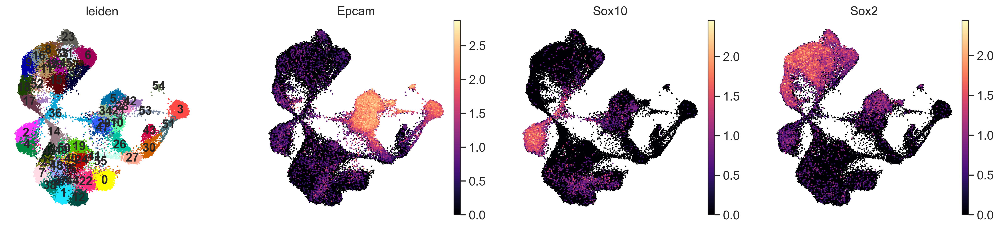

In [ ]:
adata=sc.read_h5ad('/home/julia/Xenioum/h5ad/2_464_working_umap.h5ad')
adata
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sox10', 'Sox2'],  size=10, frameon=False,  color_map='magma', legend_loc='on data')

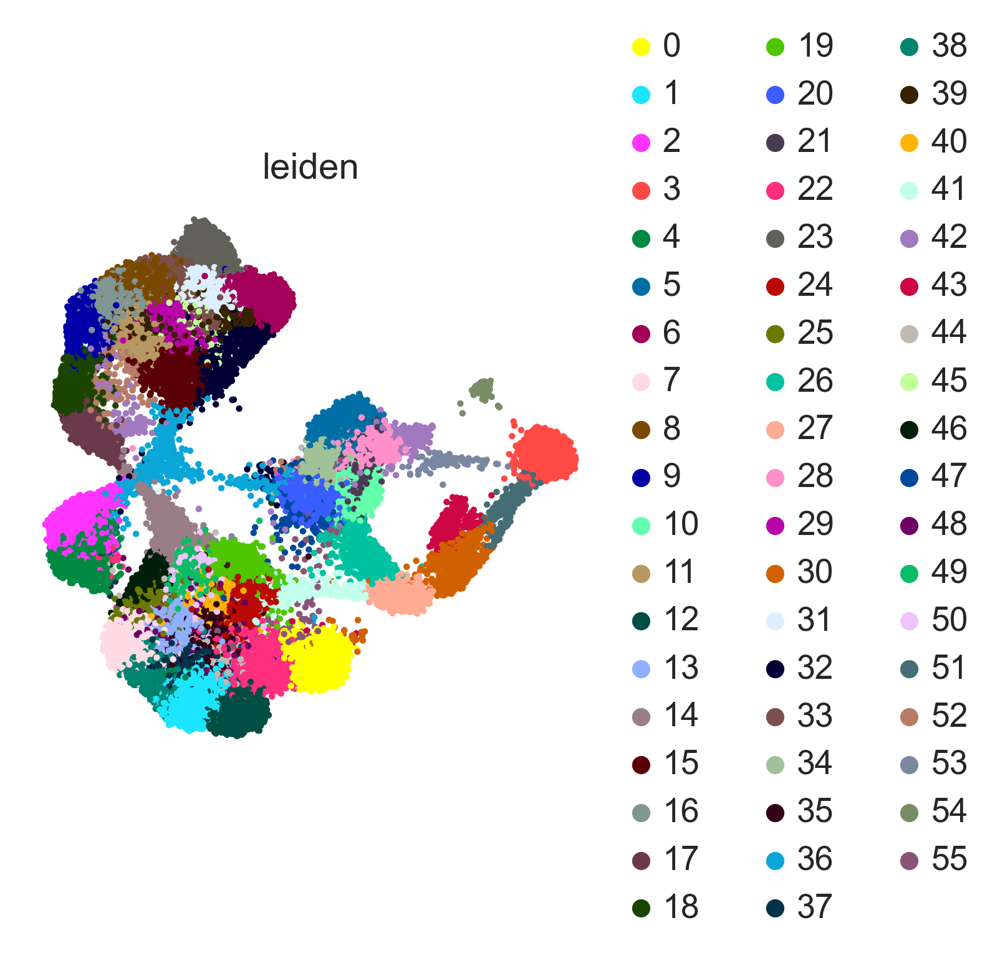

In [ ]:
sc.pl.umap(adata, color=['leiden'],  size=25, frameon=False,  color_map='magma',    save='___UMAP_all_leiden.svg')

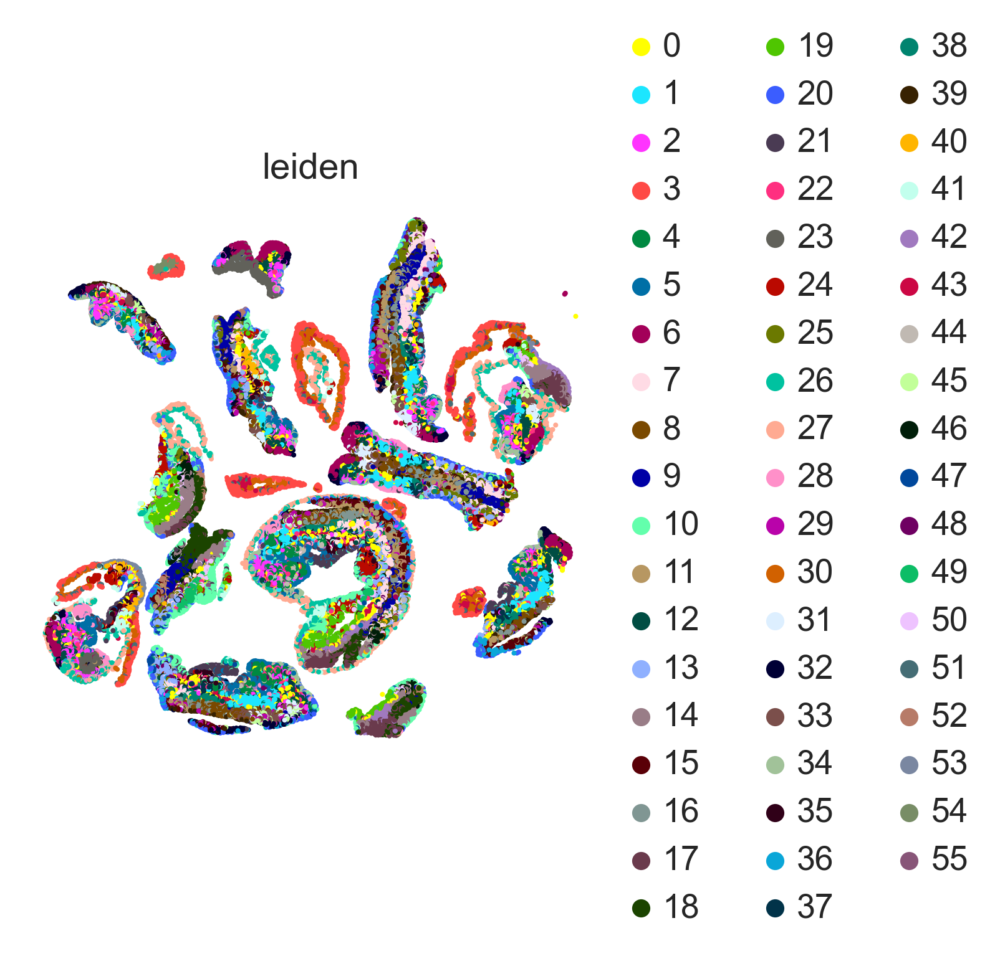

In [ ]:
sc.pl.embedding(adata, basis="spatial", color=['leiden'], frameon=False, s=15,
                #save='___spatial_all_leiden.svg'
               )

In [ ]:
adata.obs.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,EmbryonicDay_8_5,cell_id_duplicate,n_genes_by_counts,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,pct_counts_in_top_30_genes,pct_counts_in_top_40_genes,leiden
aaaapaon-1,8_5_region2_aaaapaon-1,2322.825684,233.058182,74,0,0,0,0,74.0,60.419065,...,8.5,8_5_region2_8_5_region2_aaaapaon-1,37,3.637586,4.317488,55.405405,77.027027,90.540541,100.0,14
aaaapmeg-1,8_5_region2_aaaapmeg-1,2324.388184,240.443604,58,0,0,0,0,58.0,63.580002,...,8.5,8_5_region2_8_5_region2_aaaapmeg-1,32,3.496508,4.077538,62.068966,79.310345,96.551724,100.0,50
aaaboemk-1,8_5_region2_aaaboemk-1,2317.033203,238.701218,74,0,0,0,0,74.0,57.529065,...,8.5,8_5_region2_8_5_region2_aaaboemk-1,35,3.583519,4.317488,50.000000,79.729730,93.243243,100.0,10
aaacmbpb-1,8_5_region2_aaacmbpb-1,2308.765625,234.199936,42,0,0,0,0,42.0,102.414379,...,8.5,8_5_region2_8_5_region2_aaacmbpb-1,23,3.178054,3.761200,66.666667,92.857143,100.000000,100.0,10
aaadaphc-1,8_5_region2_aaadaphc-1,2313.683594,257.991547,114,0,0,0,0,114.0,139.803755,...,8.5,8_5_region2_8_5_region2_aaadaphc-1,39,3.688879,4.744932,51.754386,77.192982,92.105263,100.0,10


In [ ]:
adata.obs['leiden1'] = adata.obs['leiden']


adata.obs=adata.obs.drop('cluster_annotation', axis=1)
adata.obs.columns

In [ ]:
cluster_df = pd.read_csv('/home/julia/Xenioum/clusters_table/slice2__8_5.csv', sep=';')
cluster_df.head()

,Clusters,name
0,0,Endothelial true
1,1,Mesenchyme of posterior branchial arches true
2,2,Neural crest of anterior branchial arches
3,3,Extraembryonic true
4,4,Neural crest mesenchyme of branchial arches true


In [ ]:
new_cluster_names=cluster_df['name'].to_list()
new_cluster_names

['Endothelial true',
 'Mesenchyme of posterior branchial arches true',
 'Neural crest of anterior branchial arches',
 'Extraembryonic true',
 'Neural crest mesenchyme of branchial arches true',
 'Ectoderm and placodes ventral branchial arches true',
 'CNS cranial neural folds',
 'Somites true',
 'CNS neural tube hindbrain trunk true',
 'CNS neural tube more ventral as compared to cluster 8 true',
 'Ectoderm body surface true',
 'CNS trunk neural tube true',
 'Mesenchyme cranial true',
 'Somites ventral part true',
 'PSM caudal true',
 'CNS dorsal neural tube trunk true',
 'CNS trunk neural tube true',
 'NMPs true',
 'PSM caudal true',
 'Endoderm gut posterior true',
 'Ectoderm body true',
 'Ectoderm and placodes ventral branchial arches heart',
 'Endothelial true',
 'CNS forebrain true',
 'Mesoderm limb bud true',
 'Somite upper part true',
 'Extraembryonic amniotic true',
 'Extraembryonic amniotic true',
 'Placodes incl otic true',
 'CNS neural tube trunk populations true',
 'Extraemb

In [ ]:
from collections import defaultdict
# Dictionary to count occurrences
name_counter = defaultdict(int)

# Result list with modified names
unique_cluster_names = []

for name in new_cluster_names:
    name_counter[name] += 1
    if name_counter[name] == 1:
        unique_cluster_names.append(name)
    else:
        unique_cluster_names.append(f"{name}_{name_counter[name]}")

# Output the new list
print(unique_cluster_names)

['Endothelial true', 'Mesenchyme of posterior branchial arches true', 'Neural crest of anterior branchial arches', 'Extraembryonic true', 'Neural crest mesenchyme of branchial arches true', 'Ectoderm and placodes ventral branchial arches true', 'CNS cranial neural folds', 'Somites true', 'CNS neural tube hindbrain trunk true', 'CNS neural tube more ventral as compared to cluster 8 true', 'Ectoderm body surface true', 'CNS trunk neural tube true', 'Mesenchyme cranial true', 'Somites ventral part true', 'PSM caudal true', 'CNS dorsal neural tube trunk true', 'CNS trunk neural tube true_2', 'NMPs true', 'PSM caudal true_2', 'Endoderm gut posterior true', 'Ectoderm body true', 'Ectoderm and placodes ventral branchial arches heart', 'Endothelial true_2', 'CNS forebrain true', 'Mesoderm limb bud true', 'Somite upper part true', 'Extraembryonic amniotic true', 'Extraembryonic amniotic true_2', 'Placodes incl otic true', 'CNS neural tube trunk populations true', 'Extraembryonic vessels', 'CNS 

In [ ]:
adata1=adata.copy()

In [ ]:
adata1.rename_categories("leiden", unique_cluster_names)

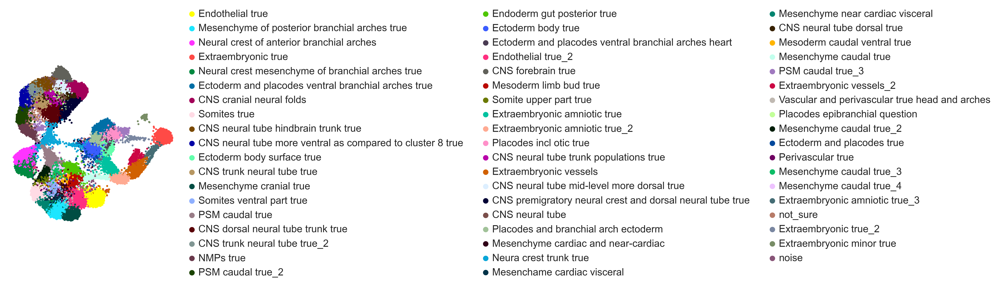

In [ ]:
sc.pl.umap(adata1, color="leiden", title="", frameon=False, size=25,
         # save="__full_annotat_9_5_1.svg"
          )

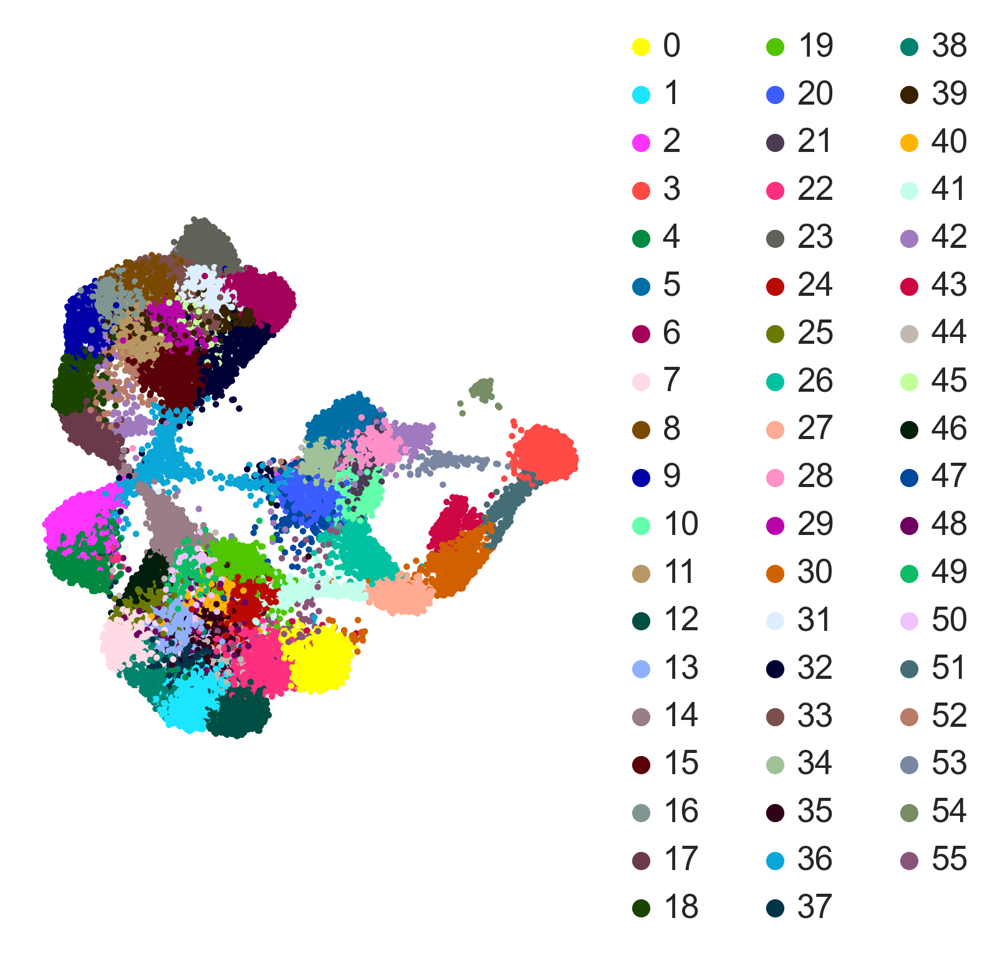

In [ ]:
sc.pl.umap(adata1, color="leiden1", title="", frameon=False, size=25,
         # save="__full_annotat_9_5_1.svg"
          )

In [ ]:
adata1.write_h5ad('/home/julia/Xenioum/h5ad/Sice_2_all_annotation_for_paper.h5ad')

In [ ]:
import numpy as np
from matplotlib import cm
from matplotlib.colors import ListedColormap
import scanpy as sc

# Define the custom colormap with grey + red
custom_reds = ListedColormap(
    np.vstack((
        cm.get_cmap("Greys", 128)(np.linspace(0.2, 0.2, 1)),  # single grey
        cm.get_cmap("Reds", 128)(np.linspace(0.1, 1, 128))     # gradient of Reds
    ))
)

# List of genes to plot
genes = ['Epcam', 'Sox10', 'Lmx1a', 'Phox2a', 'Neurod1', 'Hmx1', 'Vax1', 'Nr2e1', 'Neurog2', 'Fezf1']

# Plot spatial embeddings
for gene in genes:
    sc.pl.embedding(
        adata,
        basis="spatial",
        color=gene,
        frameon=False,
        s=20,
        cmap=custom_reds,   # <- use the custom cmap
        show=False,
       save=f'__8_5_{gene}_full_spatial.svg'
    )

# Plot UMAPs
for gene in genes:
    sc.pl.umap(
        adata,
        color=gene,
        cmap=custom_reds,   # <- use the same cmap
        s=50,
        frameon=False,
        show=False,
       save=f'__8_5_{gene}_full_umap.svg'
    )


/tmp/ipykernel_4139744/1460140075.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cm.get_cmap("Greys", 128)(np.linspace(0.2, 0.2, 1)),  # single grey
/tmp/ipykernel_4139744/1460140075.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cm.get_cmap("Reds", 128)(np.linspace(0.1, 1, 128))     # gradient of Reds


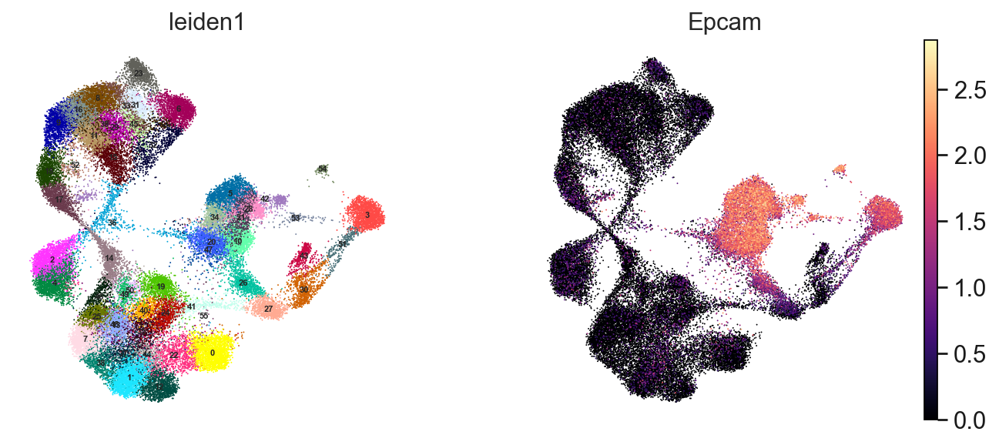

In [ ]:
sc.settings.set_figure_params(dpi=80)
sc.pl.umap(adata1, color=['leiden1', 'Epcam'],
           size=3, frameon=False, color_map='magma', legend_loc='on data',  legend_fontsize=5)

# EPCAM

In [ ]:
adata1_ep=adata[adata.obs['leiden1'].isin(['26','47','20','10','21','34', '28','5', '42'])]

In [ ]:
adata1_ep

View of AnnData object with n_obs × n_vars = 8049 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'EmbryonicDay_8_5', 'cell_id_duplicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes', 'leiden', 'leiden1'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
adata1_ep.raw = adata1_ep
sc.pp.normalize_total(adata1_ep, inplace=True) # Normalize counts per cell
sc.pp.log1p(adata1_ep) # Logarithmize

# sc.pp.highly_variable_genes (adata) # 313 genes

sc.pp.pca(adata1_ep, n_comps=90) # do principal component analysis
sc.pp.neighbors(adata1_ep, n_neighbors=45, n_pcs=80) # compute a neighborhood graph
sc.tl.umap(adata1_ep) # embed the neighborhood graph of the data
sc.tl.leiden(adata1_ep, resolution=2.5) # cluster the cells into subgroups


/tmp/ipykernel_4139744/1289826150.py:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata1_ep, resolution=2.5) # cluster the cells into subgroups


In [ ]:
adata1_ep.write_h5ad('/home/julia/Xenioum/h5ad/adata2_8-5_ep_clusters_annotation__111.h5ad')

In [ ]:
adata1_ep=sc.read_h5ad('/home/julia/Xenioum/h5ad/adata2_8-5_ep_clusters_annotation__111.h5ad')

In [ ]:
adata1_ep.obs.head(2)

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,pct_counts_in_top_30_genes,pct_counts_in_top_40_genes,leiden,highlight,cluster_annotation,Sclice
0,aaaboemk-1,2317.033203,238.701218,74,0,0,0,0,74.0,57.529065,...,3.583519,4.317488,50.000000,79.729730,93.243243,100.0,5,Other,Ectoderm body surface true,Slice_2
1,aaacmbpb-1,2308.765625,234.199936,42,0,0,0,0,42.0,102.414379,...,3.178054,3.761200,66.666667,92.857143,100.000000,100.0,5,Other,Ectoderm body surface true,Slice_2


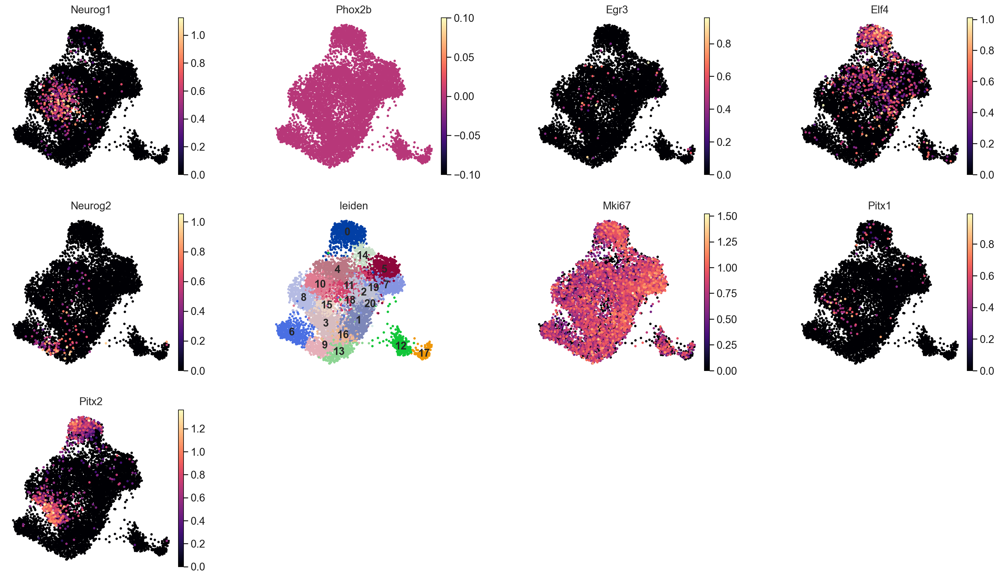

In [ ]:
# Neurogenesis
sc.pl.umap(adata1_ep, color=[   'Neurog1' , 'Phox2b', 'Egr3' , 'Elf4', 'Neurog2', 'leiden', 'Mki67', 'Pitx1', 'Pitx2'], legend_loc='on data', wspace=0.4, frameon=False, size=40, color_map='magma')

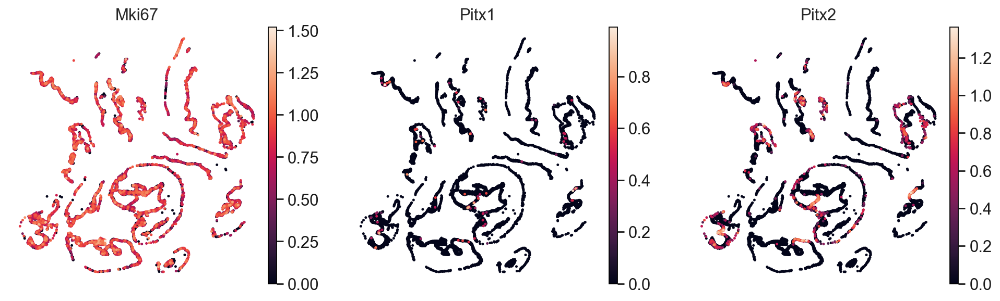

In [ ]:
adata1_ep.obsm["X_spatial"] = adata1_ep.obsm["spatial"].copy()
sc.pl.embedding(adata1_ep, basis="X_spatial", color=['Mki67', 'Pitx1', 'Pitx2'], frameon=False, s=20)

In [ ]:
adata1_ep.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,pct_counts_in_top_30_genes,pct_counts_in_top_40_genes,leiden,highlight,cluster_annotation,Sclice
0,aaaboemk-1,2317.033203,238.701218,74,0,0,0,0,74.0,57.529065,...,3.583519,4.317488,50.000000,79.729730,93.243243,100.000000,5,Other,Ectoderm body surface true,Slice_2
1,aaacmbpb-1,2308.765625,234.199936,42,0,0,0,0,42.0,102.414379,...,3.178054,3.761200,66.666667,92.857143,100.000000,100.000000,5,Other,Ectoderm body surface true,Slice_2
2,aaadaphc-1,2313.683594,257.991547,114,0,0,0,0,114.0,139.803755,...,3.688879,4.744932,51.754386,77.192982,92.105263,100.000000,5,Other,Ectoderm body surface true,Slice_2
3,aaaddmaa-1,2308.055420,242.467468,33,0,0,0,0,33.0,85.164691,...,3.135494,3.526361,63.636364,93.939394,100.000000,100.000000,5,Other,Ectoderm body surface true,Slice_2
4,aaajpago-1,2310.881104,249.228012,45,0,0,0,0,45.0,81.055472,...,3.218876,3.828641,64.444444,91.111111,100.000000,100.000000,5,Other,Ectoderm body surface true,Slice_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8044,oiklhhmn-1,2029.167480,1829.868530,107,0,0,0,0,107.0,141.610005,...,3.784190,4.682131,59.813084,78.504673,87.850467,97.196262,0,Other,Extraembryonic amniotic true,Slice_2
8045,oikofhek-1,1991.204712,1816.857666,78,0,0,0,0,78.0,96.815004,...,3.688879,4.369448,52.564103,75.641026,88.461538,100.000000,10,Other,Ectoderm body true,Slice_2
8046,oilbnjka-1,2022.097778,1818.141602,52,0,0,0,0,52.0,79.249222,...,3.295837,3.970292,67.307692,88.461538,100.000000,100.000000,4,Other,Ectoderm body true,Slice_2
8047,oipbnlek-1,1979.597168,1812.397217,93,0,0,0,0,93.0,51.342658,...,3.737670,4.543295,59.139785,77.419355,88.172043,98.924731,4,Other,Ectoderm body true,Slice_2


In [ ]:
adata1_ep.obs.columns

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'control_codeword_counts',
       'unassigned_codeword_counts', 'deprecated_codeword_counts',
       'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes',
       'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes', 'leiden',
       'highlight', 'cluster_annotation', 'Sclice'],
      dtype='object')

In [ ]:
adata1_ep.obs=adata1_ep.obs.drop('cluster_annotation', axis=1)
adata1_ep.obs.columns

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'control_codeword_counts',
       'unassigned_codeword_counts', 'deprecated_codeword_counts',
       'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes',
       'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes', 'leiden',
       'highlight', 'Sclice'],
      dtype='object')

In [ ]:
cluster_df1 = pd.read_csv('/home/julia/Xenioum/8_5__EPCAM_clusters/Slice2_EPCAM__8_5.csv', sep=';')
cluster_df1.head()

,clusters,name
0,0,extraembryonic
1,1,ectoderm above heart and epibranchial
2,2,epithelium abdominal
3,3,ectoderm mandible epibranchial
4,4,neural crest premigratory


In [ ]:
new_cluster_names2=cluster_df1['name'].to_list()
new_cluster_names2

['extraembryonic',
 'ectoderm above heart and epibranchial',
 'epithelium abdominal',
 'ectoderm mandible epibranchial',
 'neural crest premigratory',
 'epithelium caudal',
 'otic',
 'epithelium caudal',
 'olfactory',
 'epibranchial placodes',
 'trigeminal',
 'epithelium caudal',
 'gut',
 'epibranchial or foregut',
 'extraembryonic',
 'trigeminal',
 'epithelium abdominal',
 'gut',
 'noise',
 'noise',
 'noise']

In [ ]:
from collections import defaultdict

# Пример: входной список имён (может быть повторяющимся)
# Если у тебя уже есть new_cluster_names2 — просто используй его
# new_cluster_names2 = list(cluster_df1['name'])  # если берёшь из DataFrame

# Шаг 1: создаём счётчик повторений и список уникальных имён
name_counter = defaultdict(int)         # словарь для подсчёта повторений
unique_cluster_names = []               # финальный список уникальных имён

# Шаг 2: проходим по каждому имени в списке
for name in new_cluster_names2:
    count = name_counter[name]          # сколько раз имя уже встречалось
    if count == 0:
        unique_cluster_names.append(name)       # первое вхождение — без суффикса
    else:
        unique_cluster_names.append(f"{name}_{count}")  # повтор — добавляем суффикс
    name_counter[name] += 1             # увеличиваем счётчик

# Шаг 3: обновляем DataFrame
cluster_df1['name'] = unique_cluster_names



In [ ]:
cluster_df1

,clusters,name
0,0,extraembryonic
1,1,ectoderm above heart and epibranchial
2,2,epithelium abdominal
3,3,ectoderm mandible epibranchial
4,4,neural crest premigratory
5,5,epithelium caudal
6,6,otic
7,7,epithelium caudal_1
8,8,olfactory
9,9,epibranchial placodes


In [ ]:
cluster_annotations = dict(zip(cluster_df1['clusters'].astype(str), cluster_df1['name']))
cluster_annotations

{'0': 'extraembryonic',
 '1': 'ectoderm above heart and epibranchial',
 '2': 'epithelium abdominal',
 '3': 'ectoderm mandible epibranchial',
 '4': 'neural crest premigratory',
 '5': 'epithelium caudal',
 '6': 'otic',
 '7': 'epithelium caudal_1',
 '8': 'olfactory',
 '9': 'epibranchial placodes',
 '10': 'trigeminal',
 '11': 'epithelium caudal_2',
 '12': 'gut',
 '13': 'epibranchial or foregut',
 '14': 'extraembryonic_1',
 '15': 'trigeminal_1',
 '16': 'epithelium abdominal_1',
 '17': 'gut_1',
 '18': 'noise',
 '19': 'noise_1',
 '20': 'noise_2'}

In [ ]:
highlight_colors = {
    'extraembryonic': '#008080',
 'ectoderm above heart and epibranchial':'#CCCCFF',
'epithelium abdominal':'#CCCCFF',
'ectoderm mandible epibranchial':'#f5b7b1',
'neural crest premigratory':'#DE3163',
'epithelium caudal':'#48c9b0',
 'otic': '#2e86c1',
  'epithelium caudal_1':'#48c9b0',
  'olfactory': 'yellow',
 'epibranchial placodes': '#7d3c98',
  'trigeminal': '#d35400',
 'epithelium caudal_2':'#48c9b0',
 'gut':'#717d7e',
  'epibranchial or foregut':'#7d3c98',
 'extraembryonic_1':"#483d8b",
 'trigeminal_1': '#d35400',
 'epithelium abdominal_1':'#CCCCFF',
 'gut_1':'#717d7e',
 'noise':'lightgray',
'noise_1':'lightgray',
 'noise_2':'lightgray'}


In [ ]:
adata1_ep1=adata1_ep.copy()

In [ ]:
# Map cluster annotations to adata1_ep using 'leiden'
adata1_ep1.obs['cluster_annotations'] = adata1_ep1.obs['leiden'].map(cluster_annotations).astype('category')


In [ ]:
adata1_ep1.uns['cluster_annotations_colors'] = [
    highlight_colors.get(cat, 'lightgray')
    for cat in adata1_ep1.obs['cluster_annotations'].cat.categories]


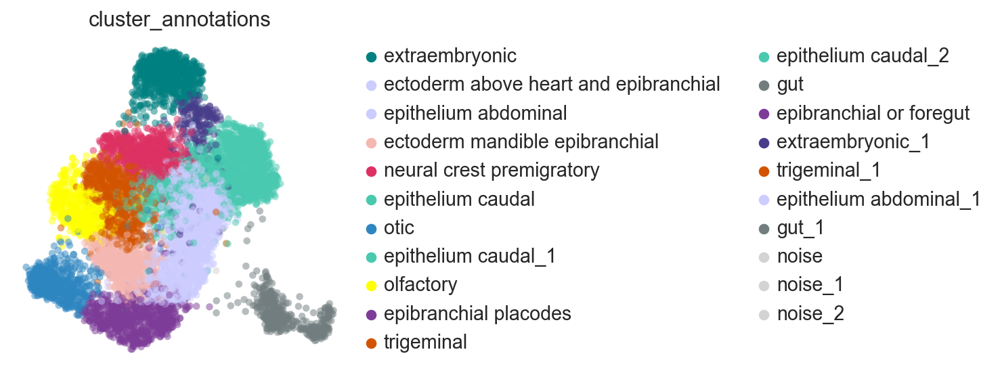

In [ ]:
adata1_ep1.uns['cluster_annotations_colors'] = [
    highlight_colors.get(cat, 'lightgray')
    for cat in adata1_ep1.obs['cluster_annotations'].cat.categories]

sc.pl.umap(
    adata1_ep1,
    color='cluster_annotations', frameon=False,
    size=90,
    alpha=0.5,
  #save='epcam_ANNOTATION.svg'
)



In [ ]:
# Create mapping: leiden cluster → annotation
leiden_to_annotation = adata1_ep1.obs.groupby('leiden')['cluster_annotations'].agg(lambda x: x.mode()[0])

# Create a color map for leiden using the annotation colors
leiden_colors = [
    highlight_colors.get(leiden_to_annotation[str(i)], 'lightgray')
    for i in adata1_ep.obs['leiden'].cat.categories
]

# Assign to uns
adata1_ep1.uns['leiden_colors'] = leiden_colors


/tmp/ipykernel_4139744/415073380.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  leiden_to_annotation = adata1_ep1.obs.groupby('leiden')['cluster_annotations'].agg(lambda x: x.mode()[0])


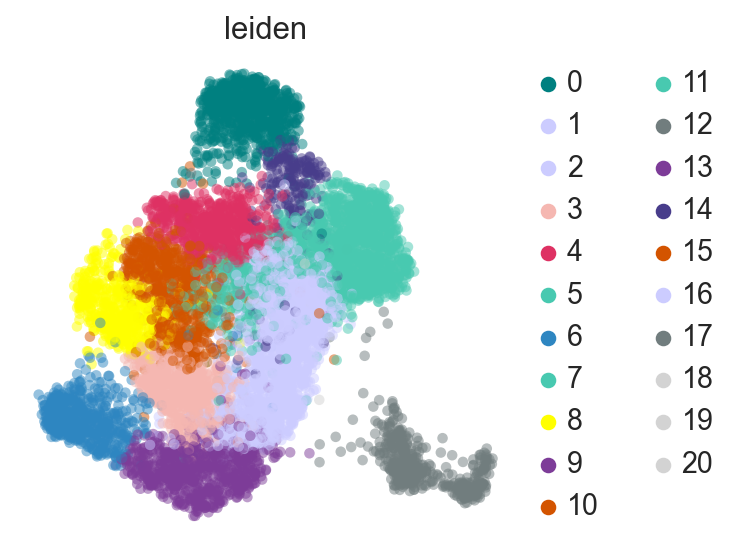

In [ ]:
sc.pl.umap(
    adata1_ep1,
    color='leiden', frameon=False,
    size=90,
    alpha=0.5,
# save='epcam_leiden.svg'
)



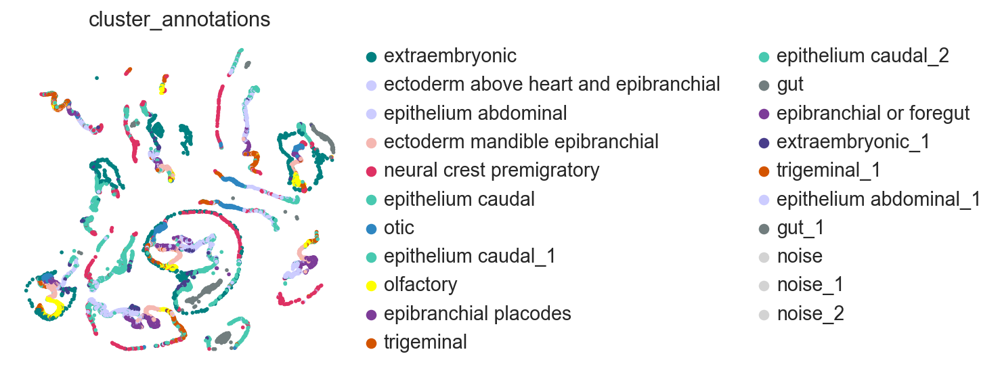

In [ ]:
sc.pl.embedding(
    adata1_ep1,
    basis='X_spatial',
   color='cluster_annotations',
    size=26,
    frameon=False,#save='__8_5_EPCAM_spatial__annotation.svg'

)

In [ ]:
import numpy as np
from matplotlib import cm
from matplotlib.colors import ListedColormap
import scanpy as sc

# Define the custom colormap with grey + red
custom_reds = ListedColormap(
    np.vstack((
        cm.get_cmap("Greys", 128)(np.linspace(0.2, 0.2, 1)),  # single grey
        cm.get_cmap("Reds", 128)(np.linspace(0.1, 1, 128))     # gradient of Reds
    ))
)

# List of genes to plot
genes = ['Epcam', 'Sox10', 'Lmx1a', 'Phox2a', 'Neurod1', 'Hmx1', 'Vax1', 'Nr2e1', 'Neurog2', 'Fezf1']

# Plot spatial embeddings
for gene in genes:
    sc.pl.embedding(
        adata1_ep1,
        basis="X_spatial",
        color=gene,
        frameon=False,
        s=20,
        cmap=custom_reds,   # <- use the custom cmap
        show=False,
      save=f'_8_5_{gene}_Epcam_spatial.svg'
    )

# Plot UMAPs
for gene in genes:
    sc.pl.umap(
        adata1_ep1,
        color=gene,
        cmap=custom_reds,   # <- use the same cmap
        s=70,
        frameon=False,
        show=False,
      save=f'_8_5_{gene}_Epcam_umap.svg'
    )


/tmp/ipykernel_4139744/2698082797.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cm.get_cmap("Greys", 128)(np.linspace(0.2, 0.2, 1)),  # single grey
/tmp/ipykernel_4139744/2698082797.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cm.get_cmap("Reds", 128)(np.linspace(0.1, 1, 128))     # gradient of Reds


In [ ]:
#Just_placodes

In [ ]:
adata1_ep2=adata1_ep1.copy()

In [ ]:
highlight_colors = {
'extraembryonic': 'lightgray',
'ectoderm above heart and epibranchial':'lightgray',
'epithelium abdominal':'lightgray',
'ectoderm mandible epibranchial':'#f5b7b1',
'neural crest premigratory':'lightgray',
'epithelium caudal':'lightgray',
'otic': '#2e86c1',
'epithelium caudal_1':'lightgray',
'olfactory': 'yellow',
'epibranchial placodes': '#7d3c98',
'trigeminal': '#d35400',
'epithelium caudal_2':'lightgray',
'gut':'lightgray',
'epibranchial or foregut':'#7d3c98',
'extraembryonic_1':"lightgray",
'trigeminal_1': '#d35400',
'epithelium abdominal_1':'lightgray',
'gut_1':'lightgray',
'noise':'lightgray',
'noise_1':'lightgray',
'noise_2':'lightgray', }


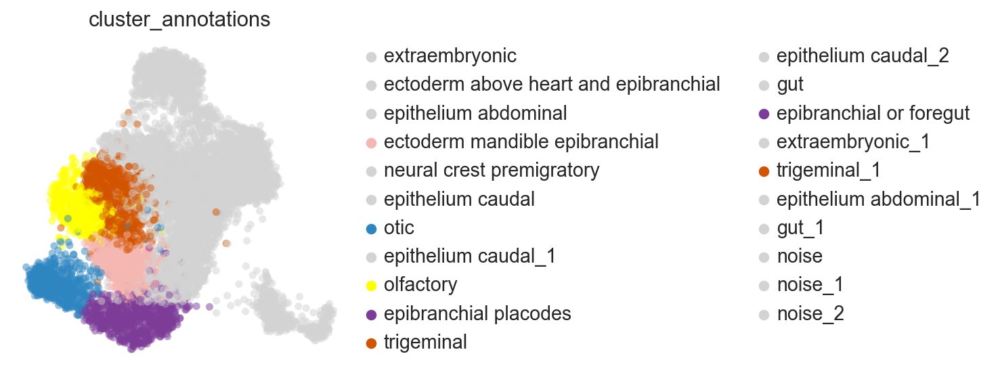

In [ ]:
adata1_ep2.uns['cluster_annotations_colors'] = [
    highlight_colors.get(cat, 'lightgray')
    for cat in adata1_ep1.obs['cluster_annotations'].cat.categories
]

sc.pl.umap(
    adata1_ep2,
    color='cluster_annotations', frameon=False,
    size=100,
    alpha=0.5,
  #save='12_06__epcam_Just_Placodes_annotat.svg'
)




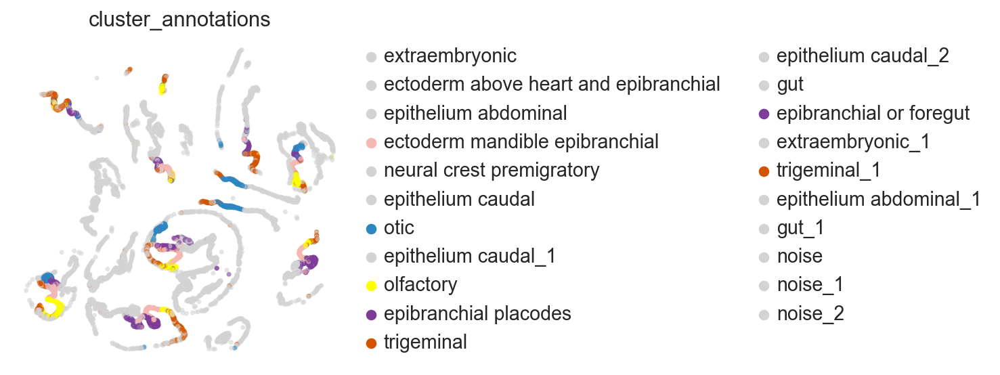

In [ ]:
sc.pl.embedding(adata1_ep2, basis="X_spatial", color=['cluster_annotations'], frameon=False,s=40 , alpha=0.6, #save='8_5_spatial_full.pdf'
               )

In [ ]:
included_categories = [k for k in highlight_colors if highlight_colors[k] != 'lightgray']

adata_filtered = adata1_ep2[adata1_ep2.obs['cluster_annotations'].isin(included_categories)].copy()
adata_filtered.obs['cluster_annotations'] = adata_filtered.obs['cluster_annotations'].astype('category')
adata_filtered.obs['cluster_annotations'] = adata_filtered.obs['cluster_annotations'].cat.set_categories(included_categories)

adata_filtered.uns['cluster_annotations_colors'] = [
    highlight_colors[cat] for cat in included_categories
]



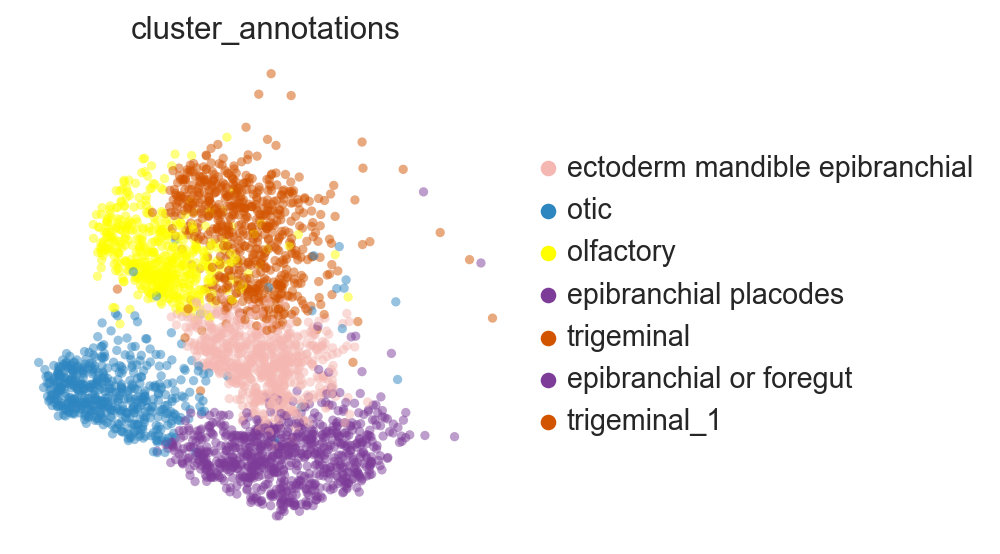

In [ ]:
sc.pl.umap(
    adata_filtered,
    color='cluster_annotations',
    frameon=False,
    size=70,
    alpha=0.5,
   # save='your_filtered_umap.svg'
)


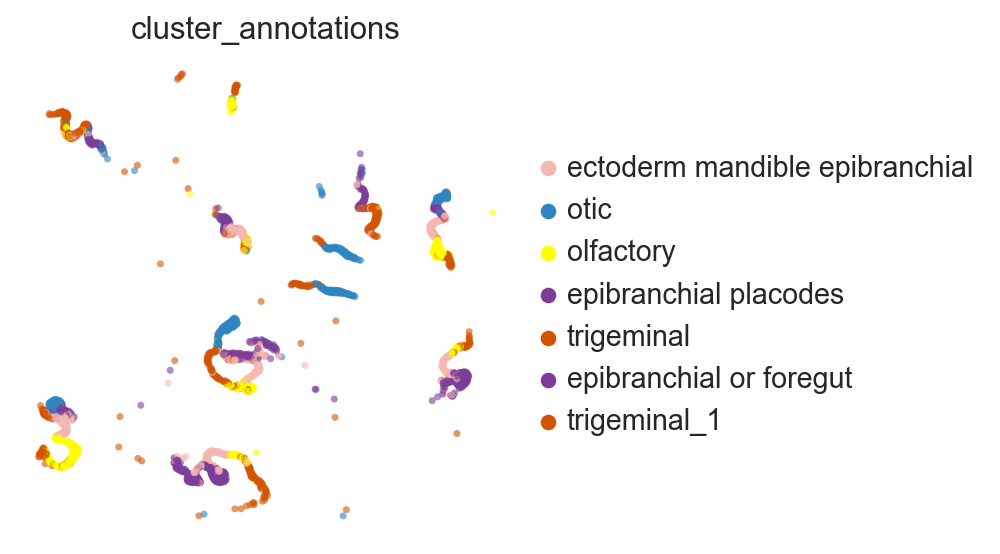

In [ ]:
sc.pl.embedding(
    adata_filtered,
    basis="X_spatial",
    color='cluster_annotations',
    frameon=False,
    s=40,
    alpha=0.6,
    #save='___your_filtered_spatial.svg'
)


In [ ]:
adata1_ep.write_h5ad('/home/julia/Xenioum/h5ad/adata3_8-5_ep_clusters_annotation_30_10_2025.h5ad')